# Fault Diagnosis Pipeline

### Imports

In [2]:
# Library imports.
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd
from pathlib import Path
import scipy
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import ExtraTreesClassifier
import torch
import torch.optim as optim
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

# Urbansurge imports.
from urbansurge import swmm_model, analysis_tools, file_utils
from urbansurge.fault_diagnosis import ann_classifier, ann_regressor, dtw_knn_classifier, quant, cnn_classifier, data_utils
from urbansurge.fault_diagnosis.accuracy_metrics import true_positive_rate

# Autoreload.
%load_ext autoreload
%autoreload 2

### Configurations

In [3]:
# SWMM model configuration file path.
config_path = r"C:\Users\ay434\Documents\urbansurge\analysis\lab_system\lab_system_config.yml"

# Node where impulse is added.
input_node = 18

# Physical model fault database path.
phy_save_fp = r"C:\Users\ay434\Documents\urbansurge\analysis\lab_system\diagnosis_pipeline\phy_impulse_fault_database.csv"

# Simulation model fault database path.
sim_save_fp = r"C:\Users\ay434\Documents\urbansurge\analysis\lab_system\diagnosis_pipeline\sim_impulse_fault_database.csv"

# Physical model with no faults (i.e., "healthy" case)
phy_healthy_save_fp = r"C:\Users\ay434\Documents\urbansurge\analysis\lab_system\diagnosis_pipeline\phy_healthy_impulse_database.csv"

# Simulation model with no faults (i.e., "healthy" case)
sim_healthy_save_fp = r"C:\Users\ay434\Documents\urbansurge\analysis\lab_system\diagnosis_pipeline\sim_healthy_impulse_database.csv"

# Figure save path.
fig_savefp = Path(r'C:\Users\ay434\Box\Research\Smart_Stormwater\Fault_Diagnosis_Paper\Manuscript\manuscript-v1\Figures')

## Physical stormwater system

In [4]:
def perturb_physical_system(config_path, diam_std=2/12, n_std=0.005, seed_rng=True):
    """
    Perturb the link diameters and roughness values of the swmm model to better represent the physical uncertainty of a real
    stormwater system.
    :param config_path: Path to swmm configuration .yml file.
    :param diam_std: Diameter perturbation standard deviation (ft). Draws from Gaussian.
    :param n_std: Manning's n perturbation standard deviation.
    :param seed_rng: If set to True, the random number generator will be the same each time.
    :return phy_swmm: Configured physical swmm model.
    """
    # Create instance of SWMM model.
    phy_swmm = swmm_model.SWMM(config_path)

    # Configure model.
    phy_swmm.configure_model()

    # All downstream links from input node.
    downstream_links = phy_swmm.get_downstream_components(input_node, 'Junction', 'Link')
    print(downstream_links)

    # Link triplets representing a single link in the system.
    link_triplets = [downstream_links[i:i+3] for i in range(0, len(downstream_links), 3)]
    print(link_triplets)

    # Use seeds for rng.
    if seed_rng is True:
        random_seeds = list(range(len(link_triplets)))
    
    # Loop through link triplets and perturb diameter and roughness.
    for i, links in enumerate(link_triplets):
        if seed_rng is True:
            # Set random seed.
            np.random.seed(random_seeds[i])

        # Get the current geometry.
        D = phy_swmm.get_link_geometry(links[0])[0]

        # Perturbed diameter.
        D_new = D + np.random.normal(0, diam_std)
        geom_new = [D_new, 0, 0, 0]

        # Get the current roughness.
        n = phy_swmm.get_link_roughness(links[0])

        # Perturbed roughness. Absolute value - perturbed roughness can only increase.
        n_new = n + abs(np.random.normal(0, n_std))

        # Set new diameter and roughness.
        for link in links:
            phy_swmm.set_link_geometry(link, geom_new)
            phy_swmm.set_link_roughness(link, n_new)
        
    return phy_swmm

## Model of stormwater system

In [5]:
# Create instance of SWMM model.
swmm = swmm_model.SWMM(config_path)

# Configure model.
swmm.configure_model()

Simulation info
Flow Units: CFS
System Units: US
Start Time: 2020-01-01 00:00:00
Start Time: 2020-01-01 06:00:00


## Run fault scenarios through systems

In [6]:
# Fault scenario list.
fault_scenarios = {'fault_type': [], 'fault_component': [], 'fault_value': []}

# Fault value type.
value_type = 'fraction'

#### Downstream links.
# All downstream links from input node.
downstream_links = swmm.get_downstream_components(input_node, 'Junction', 'Link')

#### Diameter fault.
# Find all links with the "clog" tag downstream of input node. Diameter fault.
clog_links = swmm.get_components_by_tag('clog')
clog_links = [int(l) for l in clog_links]
fault_components = np.intersect1d(downstream_links, clog_links)
fault_values = np.linspace(0.1, 0.9, 40)

# Add faults to scenario dictionary.
for fault_component in fault_components:
    for fault_value in fault_values:
        fault_scenarios['fault_type'].append('diameter') 
        fault_scenarios['fault_component'].append(fault_component)
        fault_scenarios['fault_value'].append(fault_value)

#### Roughness fault.
# Find all links downstream of input node that don't have "clog" tag. Roughness fault.
fault_components = [l for l in downstream_links if int(l) not in clog_links]
fault_values = np.linspace(1.5, 6, 40)

# Add faults to scenario dictionary.
for fault_component in fault_components:
    for fault_value in fault_values:
        fault_scenarios['fault_type'].append('roughness') 
        fault_scenarios['fault_component'].append(fault_component)
        fault_scenarios['fault_value'].append(fault_value)

#### Storage fault.
fault_components = [20]
fault_values = np.linspace(0.1, 0.9, 40)

# Add faults to scenario dictionary.
for fault_component in fault_components:
    for fault_value in fault_values:
        fault_scenarios['fault_type'].append('silting') 
        fault_scenarios['fault_component'].append(fault_component)
        fault_scenarios['fault_value'].append(fault_value)

#### Create fault scenario data frame.
fault_scenario_df = pd.DataFrame(fault_scenarios)
fault_scenario_df.head()

,fault_type,fault_component,fault_value
0,diameter,76,0.100000
1,diameter,76,0.120513
2,diameter,76,0.141026
3,diameter,76,0.161538
4,diameter,76,0.182051


### Functions to add faults to system

In [7]:
def diameter_fault(swmm, fault_component, fault_value, value_type):
    # Get initial diameter.
    initial_geometry = swmm.get_link_geometry(fault_component)
    initial_diameter = initial_geometry[0]

    # Handle percentage fault or absolute fault.
    if value_type == 'fraction':
        offset = initial_diameter * fault_value
    elif value_type == 'absolute':
        offset = fault_value
    else:
        raise ValueError('Value type incorrectly specified as', value_type)

    # Update the link diameter.
    update_geometry = initial_geometry.copy()
    update_geometry[0] = initial_diameter - offset
    swmm.set_link_geometry(fault_component, update_geometry)

    # Update the link offsets.
    swmm.set_link_offsets(fault_component, (offset, offset))
    
    return swmm

def roughness_fault(swmm, fault_component, fault_value, value_type):
    # Assign fault variables.
    link_id = fault_component
    n = fault_value

    # Get link roughness.
    link_n = swmm.get_link_roughness(link_id)

    # Handle percentage fault or absolute fault.
    if value_type == 'fraction':
        n = link_n * fault_value
    elif value_type == 'absolute':
        n = fault_value
    else:
        raise ValueError('Value type incorrectly specified as', value_type)

    # Update the link roughness.
    swmm.set_link_roughness(link_id, n)
    
    return swmm
    
def silting_fault(swmm, fault_component, fault_value, value_type):
    # Assign fault variables.
    storage_id = fault_component
    silt_depth = fault_value

    # Get storage depth.
    Ds_init = swmm.get_storage_property(storage_id, 'MaxDepth')
    
    # Get inlet conduit offsets.
    inlet_link_id = swmm.get_storage_inlet(storage_id)
    (inlet_in_offset, inlet_out_offset_init) = swmm.get_link_offsets(inlet_link_id)

    # Get outlet conduit offsets.
    outlet_link_id = swmm.get_storage_outlet(storage_id)
    (outlet_in_offset_init, outlet_out_offset) = swmm.get_link_offsets(outlet_link_id)

    # Get the storage invert elevation.
    zi_init = swmm.get_storage_property(storage_id, 'Elev.')

    # Update the storage_depth.
    Ds = Ds_init - silt_depth
    swmm.set_storage_property(storage_id, 'MaxDepth', Ds)
    
    # Update inlet conduit offset.
    inlet_out_offset = inlet_out_offset_init - silt_depth
    swmm.set_link_offsets(inlet_link_id, (inlet_in_offset, inlet_out_offset))

    # Update outlet conduit offset.
    outlet_in_offset = outlet_in_offset_init - silt_depth
    swmm.set_link_offsets(outlet_link_id, (outlet_in_offset, outlet_out_offset))

    # Update storage invert elevation.
    zi = zi_init + silt_depth
    swmm.set_storage_property(storage_id, 'Elev.', zi)
    
    return swmm

### Fault scenarios in physical system

In [8]:
output_df_list = []
for i in range(fault_scenario_df.shape[0]):
    # Create instance of swmm model.
    # phy_swmm = perturb_physical_system(config_path, diam_std=0, n_std=0.0)
    print('\n', '<<< FINISHED PERTURBATION >>>', '\n')

    phy_swmm = swmm_model.SWMM(config_path)
    phy_swmm.configure_model()
    
    # Fault type, component, and value.
    fault_type = fault_scenario_df.loc[i, 'fault_type']
    fault_component = fault_scenario_df.loc[i, 'fault_component']
    fault_value = fault_scenario_df.loc[i, 'fault_value']
    
    if fault_type == 'diameter':
        phy_swmm = diameter_fault(phy_swmm, fault_component, fault_value, value_type)

    elif fault_type == 'roughness':
        phy_swmm = roughness_fault(phy_swmm, fault_component, fault_value, value_type)

    elif fault_type == 'silting':
        phy_swmm = silting_fault(phy_swmm, fault_component, fault_value, value_type)

    # Run the simulation.
    phy_swmm.run_simulation()

    # OUTPUT TO DATA FRAME
    # ---------------------------------------------------------------------
    # Get the node depths.
    node_depth_df = phy_swmm.get_node_depth()

    # Get node flooding.
    node_flood_df = phy_swmm.get_node_flooding()

    # Get node inflow.
    node_total_inflow_df = phy_swmm.get_node_total_inflow()

    # Get link flow.
    link_flow_df = phy_swmm.get_link_flow()

    # Get link depth.
    link_depth_df = phy_swmm.get_link_depth()

    # Get link velocity.
    link_velocity_df = phy_swmm.get_link_velocity()

    # Get precipitation time series.
    prcp_df = phy_swmm.get_rainfall_timeseries()

    # Only include link depth.
    fault_df = link_depth_df.copy()

    # # Join data frames.
    fault_df = fault_df.merge(node_flood_df, on='datetime')
    # fault_df = fault_df.merge(node_total_inflow_df, on='datetime')
    # fault_df = fault_df.merge(link_flow_df, on='datetime')
    # fault_df = fault_df.merge(link_depth_df, on='datetime')
    fault_df = fault_df.merge(link_velocity_df, on='datetime')
    # fault_df = fault_df.merge(prcp_df, on='datetime')

    # Add fault type, component, and value.
    fault_df['fault_type'] = fault_type
    fault_df['fault_component'] = fault_component
    fault_df['fault_value'] = fault_value
    fault_df['scenario'] = i
    fault_df = fault_df.copy()

    output_df_list.append(fault_df)

    print('FAULT COMPONENTS', [df.loc[0, 'fault_component'] for df in output_df_list])
    print('SHAPE', fault_df.shape)

fault_df = pd.concat(output_df_list)
print(fault_df.shape)
print(phy_save_fp)
fault_df.to_csv(phy_save_fp, index=False)


 <<< FINISHED PERTURBATION >>> 

Simulation info
Flow Units: CFS
System Units: US
Start Time: 2020-01-01 00:00:00
Start Time: 2020-01-01 06:00:00
Updated Geom1 value to 0.9 for 76 in 76
Updated Geom2 value to 0.0 for 76 in 76
Updated Geom3 value to 0.0 for 76 in 76
Updated Geom4 value to 0.0 for 76 in 76
Set Link 76 geometry to [0.9, 0.0, 0.0, 0.0]
Updated InOffset value to 0.1 for 76 in 76
Updated OutOffset value to 0.1 for 76 in 76
Set Link 76 offsets to (0.1, 0.1)
INP PATH: C:\Users\ay434\Documents\urbansurge\analysis\lab_system\lab_system_tmp.inp
2020-01-01 00:00:01 , 0
2020-01-01 00:02:58 , 1
2020-01-01 00:04:06 , 1
2020-01-01 00:05:05 , 1
2020-01-01 00:05:58 , 2
2020-01-01 00:06:48 , 2
2020-01-01 00:07:38 , 2
2020-01-01 00:08:28 , 2
2020-01-01 00:09:18 , 3
2020-01-01 00:10:08 , 3
2020-01-01 00:10:58 , 3
2020-01-01 00:11:48 , 3
2020-01-01 00:12:38 , 4
2020-01-01 00:13:28 , 4
2020-01-01 00:14:18 , 4
2020-01-01 00:15:08 , 4
2020-01-01 00:15:58 , 4
2020-01-01 00:16:48 , 5
2020-01-01

### Fault scenarios in stormwater system model

In [9]:
output_df_list = []
for i in range(fault_scenario_df.shape[0]):
    # Create instance of SWMM model.
    sim_swmm = swmm_model.SWMM(config_path)

    # Configure model.
    sim_swmm.configure_model()
    
    # Fault type, component, and value.
    fault_type = fault_scenario_df.loc[i, 'fault_type']
    fault_component = fault_scenario_df.loc[i, 'fault_component']
    fault_value = fault_scenario_df.loc[i, 'fault_value']
    
    if fault_type == 'diameter':
        sim_swmm = diameter_fault(sim_swmm, fault_component, fault_value, value_type)

    elif fault_type == 'roughness':
        sim_swmm = roughness_fault(sim_swmm, fault_component, fault_value, value_type)

    elif fault_type == 'silting':
        sim_swmm = silting_fault(sim_swmm, fault_component, fault_value, value_type)

    # Run the simulation.
    sim_swmm.run_simulation()

    # OUTPUT TO DATA FRAME
    # ---------------------------------------------------------------------
    # Get the node depths.
    node_depth_df = sim_swmm.get_node_depth()

    # Get node flooding.
    node_flood_df = sim_swmm.get_node_flooding()

    # Get node inflow.
    node_total_inflow_df = sim_swmm.get_node_total_inflow()

    # Get link flow.
    link_flow_df = sim_swmm.get_link_flow()

    # Get link depth.
    link_depth_df = sim_swmm.get_link_depth()

    # Get link velocity.
    link_velocity_df = sim_swmm.get_link_velocity()

    # Get precipitation time series.
    prcp_df = sim_swmm.get_rainfall_timeseries()

    # Only include link depth.
    fault_df = link_depth_df.copy()

    # # Join data frames.
    fault_df = fault_df.merge(node_flood_df, on='datetime')
    # fault_df = fault_df.merge(node_total_inflow_df, on='datetime')
    # fault_df = fault_df.merge(link_flow_df, on='datetime')
    # fault_df = fault_df.merge(link_depth_df, on='datetime')
    fault_df = fault_df.merge(link_velocity_df, on='datetime')
    # fault_df = fault_df.merge(prcp_df, on='datetime')

    # Add fault type, component, and value.
    fault_df['fault_type'] = fault_type
    fault_df['fault_component'] = fault_component
    fault_df['fault_value'] = fault_value
    fault_df['scenario'] = i
    fault_df = fault_df.copy()

    output_df_list.append(fault_df)

    print('FAULT COMPONENTS', [df.loc[0, 'fault_component'] for df in output_df_list])
    print('SHAPE', fault_df.shape)

fault_df = pd.concat(output_df_list)
print(fault_df.shape)
print(sim_save_fp)
fault_df.to_csv(sim_save_fp, index=False)

Simulation info
Flow Units: CFS
System Units: US
Start Time: 2020-01-01 00:00:00
Start Time: 2020-01-01 06:00:00
Updated Geom1 value to 0.9 for 76 in 76
Updated Geom2 value to 0.0 for 76 in 76
Updated Geom3 value to 0.0 for 76 in 76
Updated Geom4 value to 0.0 for 76 in 76
Set Link 76 geometry to [0.9, 0.0, 0.0, 0.0]
Updated InOffset value to 0.1 for 76 in 76
Updated OutOffset value to 0.1 for 76 in 76
Set Link 76 offsets to (0.1, 0.1)
INP PATH: C:\Users\ay434\Documents\urbansurge\analysis\lab_system\lab_system_tmp.inp
2020-01-01 00:00:01 , 0
2020-01-01 00:02:58 , 1
2020-01-01 00:04:06 , 1
2020-01-01 00:05:05 , 1
2020-01-01 00:05:58 , 2
2020-01-01 00:06:48 , 2
2020-01-01 00:07:38 , 2
2020-01-01 00:08:28 , 2
2020-01-01 00:09:18 , 3
2020-01-01 00:10:08 , 3
2020-01-01 00:10:58 , 3
2020-01-01 00:11:48 , 3
2020-01-01 00:12:38 , 4
2020-01-01 00:13:28 , 4
2020-01-01 00:14:18 , 4
2020-01-01 00:15:08 , 4
2020-01-01 00:15:58 , 4
2020-01-01 00:16:48 , 5
2020-01-01 00:17:38 , 5
2020-01-01 00:18:28 

### Physical system without faults

In [10]:
# Create instance of swmm model.
# phy_swmm = perturb_physical_system(config_path, diam_std=0, n_std=0.0)
print('\n', '<<< FINISHED PERTURBATION >>>', '\n')

phy_swmm = swmm_model.SWMM(config_path)
phy_swmm.configure_model()

# Configure model.
phy_swmm.configure_model()

# Run the simulation.
phy_swmm.run_simulation()

# OUTPUT TO DATA FRAME
# ---------------------------------------------------------------------
# Get the node depths.
node_depth_df = phy_swmm.get_node_depth()

# Get node flooding.
node_flood_df = phy_swmm.get_node_flooding()

# Get node inflow.
node_total_inflow_df = phy_swmm.get_node_total_inflow()

# Get link flow.
link_flow_df = phy_swmm.get_link_flow()

# Get link depth.
link_depth_df = phy_swmm.get_link_depth()

# Get link velocity.
link_velocity_df = phy_swmm.get_link_velocity()

# Get precipitation time series.
prcp_df = phy_swmm.get_rainfall_timeseries()

# Join data frames.
output_df = node_depth_df.merge(node_flood_df, on='datetime')
output_df = output_df.merge(node_total_inflow_df, on='datetime')
output_df = output_df.merge(link_flow_df, on='datetime')
output_df = output_df.merge(link_depth_df, on='datetime')
output_df = output_df.merge(link_velocity_df, on='datetime')
output_df = output_df.merge(prcp_df, on='datetime')

print(output_df.shape)
output_df.to_csv(phy_healthy_save_fp, index=False)


 <<< FINISHED PERTURBATION >>> 

Simulation info
Flow Units: CFS
System Units: US
Start Time: 2020-01-01 00:00:00
Start Time: 2020-01-01 06:00:00
INP PATH: C:\Users\ay434\Documents\urbansurge\analysis\lab_system\lab_system_tmp.inp
2020-01-01 00:00:01 , 0
2020-01-01 00:02:58 , 1
2020-01-01 00:04:06 , 1
2020-01-01 00:05:05 , 1
2020-01-01 00:05:58 , 2
2020-01-01 00:06:48 , 2
2020-01-01 00:07:38 , 2
2020-01-01 00:08:28 , 2
2020-01-01 00:09:18 , 3
2020-01-01 00:10:08 , 3
2020-01-01 00:10:58 , 3
2020-01-01 00:11:48 , 3
2020-01-01 00:12:38 , 4
2020-01-01 00:13:28 , 4
2020-01-01 00:14:18 , 4
2020-01-01 00:15:08 , 4
2020-01-01 00:15:58 , 4
2020-01-01 00:16:48 , 5
2020-01-01 00:17:38 , 5
2020-01-01 00:18:28 , 5
2020-01-01 00:19:18 , 5
2020-01-01 00:20:08 , 6
2020-01-01 00:20:58 , 6
2020-01-01 00:21:48 , 6
2020-01-01 00:22:38 , 6
2020-01-01 00:23:28 , 7
2020-01-01 00:24:18 , 7
2020-01-01 00:25:08 , 7
2020-01-01 00:25:58 , 7
2020-01-01 00:26:48 , 7
2020-01-01 00:27:38 , 8
2020-01-01 00:28:28 , 8


### Simulation without faults

In [11]:
# Create instance of SWMM model.
swmm = swmm_model.SWMM(config_path)

# Configure model.
swmm.configure_model()

# Run the simulation.
swmm.run_simulation()

# OUTPUT TO DATA FRAME
# ---------------------------------------------------------------------
# Get the node depths.
node_depth_df = swmm.get_node_depth()

# Get node flooding.
node_flood_df = swmm.get_node_flooding()

# Get node inflow.
node_total_inflow_df = swmm.get_node_total_inflow()

# Get link flow.
link_flow_df = swmm.get_link_flow()

# Get link depth.
link_depth_df = swmm.get_link_depth()

# Get link velocity.
link_velocity_df = swmm.get_link_velocity()

# Get precipitation time series.
prcp_df = swmm.get_rainfall_timeseries()

# Join data frames.
output_df = node_depth_df.merge(node_flood_df, on='datetime')
output_df = output_df.merge(node_total_inflow_df, on='datetime')
output_df = output_df.merge(link_flow_df, on='datetime')
output_df = output_df.merge(link_depth_df, on='datetime')
output_df = output_df.merge(link_velocity_df, on='datetime')
output_df = output_df.merge(prcp_df, on='datetime')

print(output_df.shape)
output_df.to_csv(sim_healthy_save_fp, index=False)

Simulation info
Flow Units: CFS
System Units: US
Start Time: 2020-01-01 00:00:00
Start Time: 2020-01-01 06:00:00
INP PATH: C:\Users\ay434\Documents\urbansurge\analysis\lab_system\lab_system_tmp.inp
2020-01-01 00:00:01 , 0
2020-01-01 00:02:58 , 1
2020-01-01 00:04:06 , 1
2020-01-01 00:05:05 , 1
2020-01-01 00:05:58 , 2
2020-01-01 00:06:48 , 2
2020-01-01 00:07:38 , 2
2020-01-01 00:08:28 , 2
2020-01-01 00:09:18 , 3
2020-01-01 00:10:08 , 3
2020-01-01 00:10:58 , 3
2020-01-01 00:11:48 , 3
2020-01-01 00:12:38 , 4
2020-01-01 00:13:28 , 4
2020-01-01 00:14:18 , 4
2020-01-01 00:15:08 , 4
2020-01-01 00:15:58 , 4
2020-01-01 00:16:48 , 5
2020-01-01 00:17:38 , 5
2020-01-01 00:18:28 , 5
2020-01-01 00:19:18 , 5
2020-01-01 00:20:08 , 6
2020-01-01 00:20:58 , 6
2020-01-01 00:21:48 , 6
2020-01-01 00:22:38 , 6
2020-01-01 00:23:28 , 7
2020-01-01 00:24:18 , 7
2020-01-01 00:25:08 , 7
2020-01-01 00:25:58 , 7
2020-01-01 00:26:48 , 7
2020-01-01 00:27:38 , 8
2020-01-01 00:28:28 , 8
2020-01-01 00:29:18 , 8
2020-01-01

## Physical and Simulation States

In [68]:
# Physical system fault database.
phy_db = pd.read_csv(phy_save_fp)

# Simulation system fault database.
sim_db = pd.read_csv(sim_save_fp)

# Physical healthy system run.
phy_healthy_db = pd.read_csv(phy_healthy_save_fp)

# Simulated healthy system run.
sim_healthy_db = pd.read_csv(sim_healthy_save_fp)

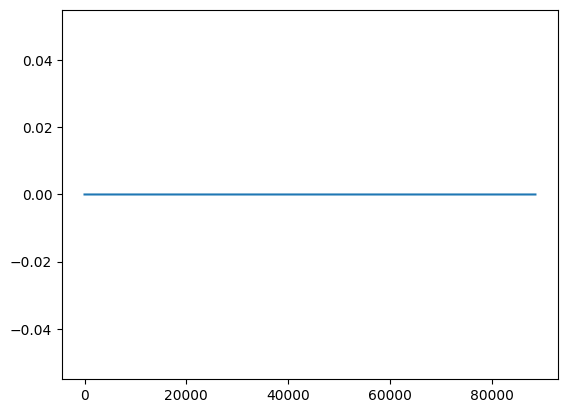

In [38]:
fig, ax = plt.subplots()
ax.plot(phy_db['Depth_link_20'] - sim_db['Depth_link_20'])


In [893]:
# Depth and velocity columns.
dep_vel_cols = [s for s in sim_healthy_db if any(sub in s for sub in ['Depth_link', 'Velocity'])]

# Select sensors.
links = [20, 21, 23, 45, 44, 43, 42, 41, 40, 39]
sensor_links = links[::1]
print(sensor_links)
dep_cols = [f'Depth_link_{s}' for s in sensor_links]
vel_cols = [f'Velocity_link_{s}' for s in sensor_links]
vel_cols = []
dep_vel_cols = dep_cols + vel_cols
extra_fault_cols = [col for col in sim_db.columns if col not in dep_vel_cols]

[20, 21, 23, 45, 44, 43, 42, 41, 40, 39]


In [894]:
def clip_timeseries(df, clip_hours, by_scenario=True):
    # Convert datetime column to datetime.
    df.datetime = pd.to_datetime(df.datetime)

    # Clip datetime.
    clip_datetime = df['datetime'].iloc[0] + timedelta(hours=clip_hours)
    
    if by_scenario == True:
        # Group by scenario.
        df_groups = df.groupby('scenario')

        # Loop through each group
        filtered_groups = []
        for name, group in df_groups:
            # Filter the group as needed
            group = group.loc[group.datetime <= clip_datetime, :]

            # Append the filtered group to the list
            filtered_groups.append(group)

        # Recombine all filtered groups into a single DataFrame
        df_filtered = pd.concat(filtered_groups)

        # Optionally, reset the index if needed
        df_filtered.reset_index(drop=True, inplace=True)
    else:
        df_filtered = df.loc[df.datetime <= clip_datetime, :]
    
    return df_filtered

# Number of hours to retain.
clip_hours = 2

# Clipped data frames.
phy_db = clip_timeseries(phy_db, clip_hours)
sim_db = clip_timeseries(sim_db, clip_hours)
phy_healthy_db = clip_timeseries(phy_healthy_db, clip_hours, by_scenario=False) 
sim_healthy_db = clip_timeseries(sim_healthy_db, clip_hours, by_scenario=False) 

### Add noise to physical system measurements

In [895]:
# Add noise.
noise_std = 0.01
phy_db[dep_vel_cols] += np.random.normal(0, noise_std, size=phy_db[dep_vel_cols].shape)

### Noisy measurements of baseline system

8.131556109785977e-05


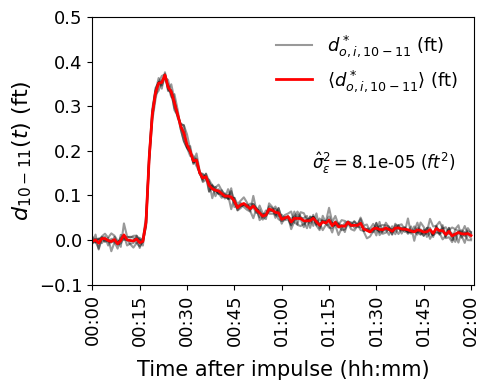

In [932]:
# Datetimes.
datetimes = list(pd.to_datetime(phy_healthy_db.datetime) - timedelta(minutes=1))

# Plot the observed depths obscured by noise.
n_samples = 5
stds = []
# for n_samples in range(3,100):
d_obs_baseline = np.zeros((phy_healthy_db.shape[0], len(dep_vel_cols), n_samples))
for i in range(n_samples):
    d_obs_noiseless = phy_healthy_db[dep_vel_cols].to_numpy()
    d_obs = d_obs_noiseless + np.random.normal(0, noise_std, size=d_obs_noiseless.shape)

    d_obs_baseline[:,:,i] = d_obs
    
# Ensemble average of baseline observations.
phy_baseline_ens = np.mean(d_obs_baseline, axis=2)

# Subtract the ensemble mean from the individual observations of baseline states.
mean_subtract = d_obs_baseline - phy_baseline_ens[:, :, np.newaxis]

# Estimated variance.
var_est = np.mean(np.var(mean_subtract, axis=0, ddof=1))
print(var_est)

# Depth-velocity column to plot.
plotting_col = 0

fig, ax = plt.subplots(figsize=(5,4))
ax.plot(datetimes, d_obs_baseline[:,plotting_col,:], c='k', alpha=0.4)  # Plot without label
ax.plot([], [], c='k', alpha=0.4, label='$d_{o,i,10-11}^*$ (ft)')  # Dummy plot for the label
ax.plot(datetimes, phy_baseline_ens[:,plotting_col], c='r', linewidth=2, label='$\\langle d_{o,i,10-11}^*\\rangle$ (ft)')
ax.tick_params(axis='both', labelsize=13)
myFmt = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(myFmt)
plt.setp(ax.get_xticklabels(), rotation=90)
ax.set_xlabel('Time after impulse (hh:mm)', fontsize=15, labelpad=10)    
ax.set_ylabel('$d_{10-11} (t)$ (ft)', fontsize=16)
ax.set_xlim([datetimes[0], datetimes[-1] + timedelta(minutes=1)])
ax.set_ylim([-0.1, 0.5])
ax.legend(fontsize=13, frameon=False)
ax.text(0.95, 0.5, '$\\hat{\sigma}_\epsilon^2 =$' + str(round(var_est,6)) + ' $(ft^2)$',
        transform=ax.transAxes,  # Coordinates relative to the axis (0,0) to (1,1)
        fontsize=12,             # Font size
        verticalalignment='top', # Align text to the top
        horizontalalignment='right')  # Align text to the right
fig.tight_layout()
fig.savefig(fig_savefp / 'baseline_depth.png', dpi=300)

### Physical system residuals

In [897]:
# Depth and velocity data from fault database.
phy_sensor_ar = phy_db[dep_vel_cols].to_numpy()

# Depth and velocity data from healthy database.
phy_healthy_sensor_ar = phy_healthy_db[dep_vel_cols].to_numpy()

# Number of times to repeat the healthy sensor data.
repeats = int(phy_db.shape[0] / phy_healthy_db.shape[0])
phy_healthy_repeats = np.tile(phy_baseline_ens.T, repeats).T

# Create residual data.
phy_residual_ar = phy_sensor_ar - phy_healthy_repeats

# Residual data frame with fault data added back in. 
phy_residual_df = pd.DataFrame(phy_residual_ar, columns=dep_vel_cols)
phy_residual_df = pd.merge(phy_residual_df, phy_db[extra_fault_cols], left_index=True, right_index=True)

In [898]:
# # Healthy physical system residuals.
# phy_healthy_sensor_ar = phy_healthy_db[dep_vel_cols].to_numpy()

# # Depth and velocity data from healthy database.
# sim_healthy_sensor_ar = sim_healthy_db[dep_vel_cols].to_numpy()

# # Create residual data.
# healthy_residual_ar = sim_healthy_sensor_ar - phy_healthy_sensor_ar

# # Residual data frame with fault data added back in. 
# healthy_residual_df = pd.DataFrame(healthy_residual_ar, columns=dep_vel_cols)
# # healthy_residual_df = pd.merge(healthy_residual_df, phy_healthy_db[extra_fault_cols], left_index=True, right_index=True)

### Simulation system residuals

In [899]:
# Depth and velocity data from fault database.
sim_sensor_ar = sim_db[dep_vel_cols].to_numpy()

# Depth and velocity data from healthy database.
healthy_sensor_ar = sim_healthy_db[dep_vel_cols].to_numpy()

# Number of times to repeat the healthy sensor data.
repeats = int(phy_db.shape[0] / sim_healthy_db.shape[0])
healthy_repeats = np.tile(healthy_sensor_ar.T, repeats).T

# Create residual data.
sim_residual_ar = sim_sensor_ar - healthy_repeats

# Residual data frame with fault data added back in. 
sim_residual_df = pd.DataFrame(sim_residual_ar, columns=dep_vel_cols)
sim_residual_df = pd.merge(sim_residual_df, sim_db[extra_fault_cols], left_index=True, right_index=True)

### Normalize residuals

In [900]:
def normalize_states(swmm, state_df, sensor_links, norm_type='geometry'):
    # Copy data frame.
    df = state_df.copy()
    
    # Loop through link IDs and normalize depth and velocity residuals.
    for link_id in sensor_links:
        if norm_type == 'geometry':
            # Get pipe diameter.
            max_depth = swmm.get_link_geometry(link_id)[0]

            # Maximum velocity occurs at 78% of diameter.
            d_vmax = 0.78 * max_depth

            # Link roughness.
            n = swmm.get_link_roughness(link_id)

            # Link slope.
            S = swmm.get_link_slope(link_id)
            S = np.abs(S)

            # Link hydraulic radius at maximum velocity depth.
            Rh = swmm.get_link_circular_Rh(d_vmax, max_depth)

            # Compute maximum velocity.
            max_velocity = (1.49 / n) * Rh**(2/3) * S**(1/2)

            # Normalize depth.
            if f'Depth_link_{link_id}' in df.columns:
                df[f'Depth_link_{link_id}'] = df[f'Depth_link_{link_id}'] / max_depth

            # Normalize velocity.
            if f'Velocity_link_{link_id}' in df.columns:
                df[f'Velocity_link_{link_id}'] = df[f'Velocity_link_{link_id}'] / max_velocity
                
        elif norm_type == 'mean_var':
            # Fault scenarios.
            scenarios = np.unique(state_df.scenario)
            
            # Loop through scenarios and normalize time series to mean of 0 and variance of 1.
            for i, scenario in enumerate(scenarios):
                for link_id in sensor_links:
                    # Normalize depth.
                    if f'Depth_link_{link_id}' in df.columns:
                        depth_ar = df[f'Depth_link_{link_id}']
                        df[f'Depth_link_{link_id}'] = (depth_ar - depth_ar.mean(axis=0)) / depth_ar.std(axis=0)

                    # Normalize velocity.
                    if f'Velocity_link_{link_id}' in df.columns:
                        vel_ar = df[f'Velocity_link_{link_id}']
                        df[f'Velocity_link_{link_id}'] = (vel_ar - vel_ar.mean(axis=0)) / vel_ar.std(axis=0)
                        
        elif norm_type is None:
            pass
        
    return df

#### Instantiate base swmm model.
# Create instance of SWMM model.
swmm = swmm_model.SWMM(config_path)

# Configure model.
swmm.configure_model()

#### Normalize physical system residuals.
phy_residual_norm_df = normalize_states(swmm, phy_residual_df, sensor_links, norm_type=None)

#### Normalize simulation system residuals.
sim_residual_norm_df = normalize_states(swmm, sim_residual_df, sensor_links, norm_type=None)

#### Normalize physical system states.
phy_norm_df = normalize_states(swmm, phy_db, sensor_links, norm_type=None)

#### Normalize simulation system states.
sim_norm_df = normalize_states(swmm, sim_db, sensor_links, norm_type=None)

# #### Normalize healthy system residuals.
# healthy_residual_df = normalize_residuals(swmm, healthy_residual_df, sensor_links)

# #### Normalize physical system residuals.
# phy_residual_df = normalize_residuals(swmm, phy_db, sensor_links)

# #### Normalize simulation system residuals.
# sim_residual_df = normalize_residuals(swmm, sim_db, sensor_links)

# #### Normalize healthy system residuals.
# healthy_residual_df = normalize_residuals(swmm, healthy_residual_df, sensor_links)

Simulation info
Flow Units: CFS
System Units: US
Start Time: 2020-01-01 00:00:00
Start Time: 2020-01-01 06:00:00


## Fault Diagnosis

### 0. Reshape state variable arrays into 3D arrays.

In [901]:
def prepare_states(state_df, dep_vel_cols):
    # Fault scenarios.
    scenarios = np.unique(state_df.scenario)
    
    # Scenario length from first scenario.
    scenario_rows = state_df.loc[state_df.scenario == scenarios[0], dep_vel_cols].shape[0]
    
    # Create X and y arrays.
    nrows = scenario_rows
    X = np.zeros((nrows, len(dep_vel_cols), len(scenarios)))
    y_series = []
    
    for i, scenario in enumerate(scenarios):
        X_scenario = state_df.loc[state_df.scenario == scenario, dep_vel_cols].to_numpy()
        X[:,:,i] = X_scenario[:nrows,:]
        y_scenario = state_df.loc[state_df.scenario == scenario, ['fault_component', 'fault_value', 'fault_type']].iloc[0,:]
        y_series.append(y_scenario)   
    
    y = pd.DataFrame(y_series)
    y.reset_index(inplace=True, drop=True)
        
    return X, y
    

Xphy_res, yphy_res = prepare_states(phy_residual_df, dep_vel_cols)
Xsim_res, ysim_res = prepare_states(sim_residual_df, dep_vel_cols)
Xphy, yphy = prepare_states(phy_db, dep_vel_cols)
Xsim, ysim = prepare_states(sim_db, dep_vel_cols)

### 1. Fault detection

0.01


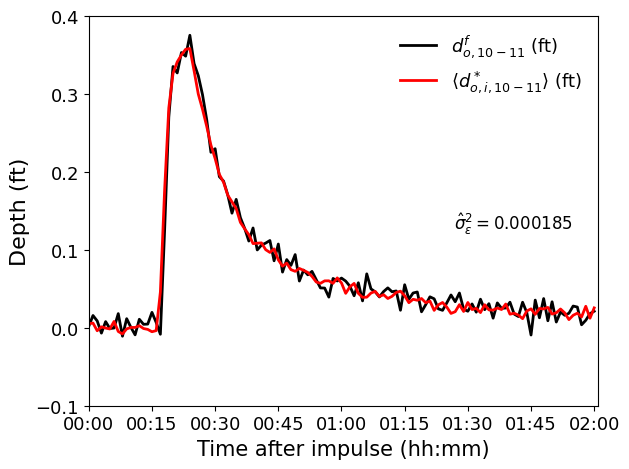

In [902]:
print(noise_std)
sensor = 20
sensor_idx = sensor_links.index(sensor)
dobs_f = Xphy[:,sensor_idx,0]# + np.random.normal(0, noise_std, size=Xphy[:,sensor_idx,100].shape)
var_est_fault = np.mean(np.var(dobs_f - phy_baseline_ens[:,sensor_idx], axis=0, ddof=1))

fig, ax = plt.subplots()
ax.plot(datetimes, dobs_f, c='k', linewidth=2, label='$d_{o,10-11}^f$ (ft)')
ax.plot(datetimes, phy_baseline_ens[:,sensor_idx], c='r', linewidth=2, label='$\\langle d_{o,i,10-11}^*\\rangle$ (ft)')
ax.tick_params(axis='both', labelsize=13)
myFmt = mdates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(myFmt)
ax.set_xlabel('Time after impulse (hh:mm)', fontsize=15)    
ax.set_ylabel('Depth (ft)', fontsize=16)
ax.set_xlim([datetimes[0], datetimes[-1] + timedelta(minutes=1)])
ax.set_ylim([-0.1, 0.4])
ax.legend(fontsize=13, frameon=False)
ax.text(0.95, 0.5, '$\\hat{\sigma}_\epsilon^2 =$' + str(round(var_est_fault,6)),
        transform=ax.transAxes,  # Coordinates relative to the axis (0,0) to (1,1)
        fontsize=12,             # Font size
        verticalalignment='top', # Align text to the top
        horizontalalignment='right')  # Align text to the right
fig.tight_layout()
# fig.savefig(fig_savefp / 'variance_of_fault.png', dpi=300)

In [903]:
# Generate baseline observations.
n_samples = 5
d_obs_baseline = np.zeros((phy_healthy_db.shape[0], len(dep_vel_cols), n_samples))
for i in range(n_samples):
    d_obs_noiseless = phy_healthy_db[dep_vel_cols].to_numpy()
    d_obs = d_obs_noiseless + np.random.normal(0, noise_std, size=d_obs_noiseless.shape)
    d_obs_baseline[:,:,i] = d_obs

# Ensemble of baseline observations.
phy_baseline_ens = np.mean(d_obs_baseline, axis=2)

# Subtract the ensemble mean from the individual observations of baseline states.
mean_subtract = d_obs_baseline - phy_baseline_ens[:, :, np.newaxis]
print(mean_subtract.shape)

# Exceeding thresholds for each sensor.
exceed_thresh = [np.percentile(np.abs(mean_subtract[:,i,:]), 95) for i in range(mean_subtract.shape[1])]
# exceed_thresh = np.percentile(np.abs(mean_subtract), 95)

# 95% exceedance counts.
exceed_95 = [np.sum(np.abs(mean_subtract[:,i,:]) > exceed_thresh[i]) for i in range(mean_subtract.shape[1])]

# K-S test on error distributions.
ks_pvals = np.zeros((len(scenarios), len(sensor_links)))
exceeders = np.zeros((len(scenarios), len(sensor_links)))
for i, scenario in enumerate(scenarios):
    print(scenario)
    # Observed time series array for all sensors.
    dobs = Xphy[:,:,i]
    
    for sensor in sensor_links:
        sensor_idx = sensor_links.index(sensor)
    #     baseline_ecdf = scipy.stats.ecdf(np.abs(mean_subtract.flatten()))
    #     fault_ecdf = scipy.stats.ecdf(np.abs(dobs_f - phy_baseline_ens[:,sensor_idx]))
    #     compare_ecdf = scipy.stats.ecdf(np.abs(d_obs_baseline[:,plotting_col,0] - phy_baseline_ens[:,sensor_idx]))

    #     fig, ax = plt.subplots()
    #     baseline_ecdf.cdf.plot(ax)
    #     fault_ecdf.cdf.plot(ax)
    #     compare_ecdf.cdf.plot(ax)
    #     ax.set_xlim(0, np.max(mean_subtract))
    
        # Observed differences.
        abs_obs_diffs = np.abs(dobs[:,sensor_idx] - phy_baseline_ens[:,sensor_idx])
    
        # Count of exceeding values.
        exceeders[i, sensor_idx] = np.sum(abs_obs_diffs > exceed_thresh[sensor_idx])

#         fault_ks = scipy.stats.ks_2samp(np.abs(mean_subtract.flatten()), 
#                                         np.abs(dobs[:,sensor_idx] - phy_baseline_ens[:,sensor_idx]))
        fault_ks = scipy.stats.anderson_ksamp([np.abs(mean_subtract[:,sensor_idx,:].flatten()), abs_obs_diffs])
    #     compare_ks = scipy.stats.ks_2samp(np.abs(mean_subtract.flatten()), 
    #                                       np.abs(d_obs_baseline[:,plotting_col,0] - phy_baseline_ens[:,sensor_idx]))

        ks_pvals[i, sensor_idx] = fault_ks.pvalue
        


(121, 10, 5)
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45


C:\Users\ay434\AppData\Local\Temp\ipykernel_25584\113013113.py:51: UserWarning: p-value floored: true value smaller than 0.001
  fault_ks = scipy.stats.anderson_ksamp([np.abs(mean_subtract[:,sensor_idx,:].flatten()), abs_obs_diffs])
C:\Users\ay434\AppData\Local\Temp\ipykernel_25584\113013113.py:51: UserWarning: p-value capped: true value larger than 0.25
  fault_ks = scipy.stats.anderson_ksamp([np.abs(mean_subtract[:,sensor_idx,:].flatten()), abs_obs_diffs])


46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165


[31, 31, 31, 31, 31, 31, 31, 31, 31, 31]
86.1% detection
100.0% A-D detection
Anderson_ksampResult(statistic=2.792457488301496, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752, 4.592, 6.546]), pvalue=0.023487318184130627)


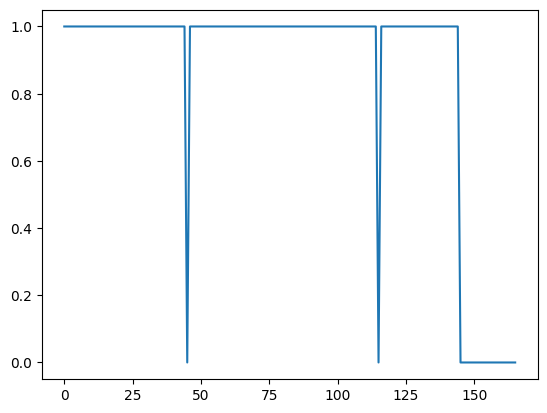

In [904]:
print(exceed_95)

# Check if any sensors detect a fault.
faults_detected = np.any(exceeders > exceed_95, axis=1)
detection_rate = np.sum(faults_detected) / len(faults_detected)
print('{:0.1f}% detection'.format(detection_rate * 100))

# A-D fault detection.
ad_faults_detected = np.any(ks_pvals < 0.01, axis=1)
ad_detection_rate = np.sum(ad_faults_detected) / len(ad_faults_detected)
print('{:0.1f}% A-D detection'.format(ad_detection_rate * 100))

print(fault_ks)

fig, ax = plt.subplots()
ax.plot(faults_detected)



#### Prepare training data

In [905]:
# Create tensors to pass into ANN. 
# 3D array where rows are time steps, columns are depth/velocity sensors, and slices are fault scenarios.
Xsim_g = Xsim_res.transpose(1, 0, 2).reshape(-1, Xsim.shape[2]).T
print('N features:', Xsim_g.shape)

#### Labels from simulation model for training.
# Convert fault class column to categorical values.
_, ysim_C = np.unique(ysim_res['fault_type'], return_inverse=True)

# Convert fault location column to categorical values.
_, ysim_L = np.unique(ysim['fault_component'], return_inverse=True)

# Convert fault severity column to numerical values.
ysim_S = np.array(ysim['fault_value'], dtype=np.float32)

N features: (166, 1210)


#### Prepare testing data

In [906]:
# Create tensors to pass into ANN.
Xphy_g = Xphy_res.transpose(1, 0, 2).reshape(-1, Xphy.shape[2]).T
print('N features:', Xphy_g.shape)

#### Labels from simulation model for training.
# Convert fault class column to categorical values.
_, yphy_C = np.unique(yphy_res['fault_type'], return_inverse=True)

# Convert fault location column to categorical values.
_, yphy_L = np.unique(yphy['fault_component'], return_inverse=True)

# Convert fault severity column to numerical values.
yphy_S = np.array(yphy['fault_value'], dtype=np.float32)

N features: (166, 1210)


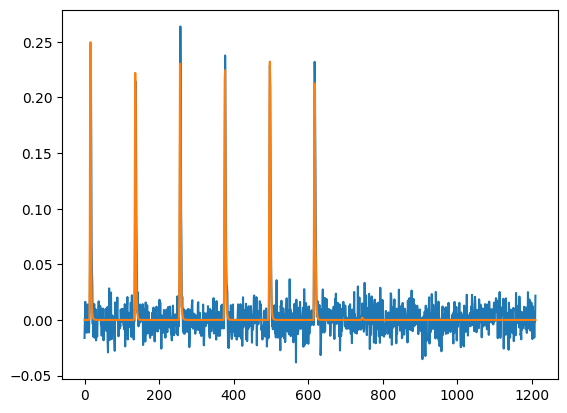

In [907]:
plotting_row = 150
fig, ax = plt.subplots()
ax.plot(Xphy_g[plotting_row,:])
ax.plot(Xsim_g[plotting_row,:])

### 2. Fault classification

In [501]:
# Model to use for classification.
classifier_model = 'ANN'

# Select model.
if classifier_model == 'ANN':
    # ANN Classifier
    # --------------------------------------------------------
    # Model, loss function, optimizer, and number of epochs.
    input_features = 121
    output_features = 3
    lr = 0.001
    criterion = nn.CrossEntropyLoss()  # Use CrossEntropyLoss for classification
    num_epochs = 1000  # Set the number of epochs

    # Instantiate model.
    model_C = ann_classifier.ANNClassifier(input_features, output_features, lr, num_epochs, criterion,
                     shuffle_train=True, shuffle_test=False)
    
    # Train model.
    model_C.fit_model(Xsim_g, ysim_C)

elif classifier_model == 'DTWKNN':
    # Dynamic time warping k-nearest neighbor
    # --------------------------------------------------------
    # Number of nearest neighbors. As a list.
    n_neighbors = 1
    
    # Instantiate model.
    model_C = dtw_knn_classifier.DTWKNNClassifier(n_neighbors)
    
    # Train model.
    model_C.fit_model(Xsim_g, ysim_C)
    
elif classifier_model == 'QUANT':
    # Quant time series classifier.
    # --------------------------------------------------------
    transform = quant.Quant()
    
    Xsim_g_tensor = torch.tensor(Xsim_g).float().unsqueeze(1)
    ysim_C_tensor = torch.tensor(ysim_C).float()

    X_training_transform = transform.fit_transform(Xsim_g_tensor, ysim_C_tensor)

    model_C = \
    ExtraTreesClassifier(
        n_estimators = 200,
        max_features = 0.1,
        criterion = "entropy",
        n_jobs = -1
    )
    
    # Train model.
    model_C.fit(X_training_transform, ysim_C_tensor)
    
elif classifier_model == 'CNN':
    # CNN time series classifier.
    # --------------------------------------------------------
    input_features = 242
    input_shape = (input_features, 1)
    output_features = 3
    num_epochs = 500  # Set the number of epochs
    batch_size = 24
    
    # Instantiate model.
    model_C = cnn_classifier.CNNClassifier(input_shape, output_features, num_epochs, batch_size)
    
    print(Xsim_g.shape)
    
    # Prepare data.
    Xsim_g_expand = np.expand_dims(Xsim_g, axis=-1)
    idx = np.random.permutation(len(Xsim_g_expand))
    X_train = Xsim_g_expand[idx,:,:]
    y_train = ysim_C[idx]
    print(X_train.shape)
    
    # Train model.
    history = model_C.fit_model(X_train, y_train)
    
    metric = "sparse_categorical_accuracy"
    plt.figure()
    plt.plot(history.history[metric])
    plt.plot(history.history["val_" + metric])
    plt.title("model " + metric)
    plt.ylabel(metric, fontsize="large")
    plt.xlabel("epoch", fontsize="large")
    plt.legend(["train", "val"], loc="best")
    plt.show()
    plt.close()
    
print('Model trained.')

Epoch: 0


RuntimeError: mat1 and mat2 shapes cannot be multiplied (32x363 and 121x512)

#### Test Classifier

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
[1 0 0 1 1 1 1 0 0 1 1 1 1 0 1 0 0 0 0 1 0 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0 1
 0 1 0 1 0 0 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 1
 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
True Positive Rate: 0.83
[[24 21  0]
 [ 3 95  2]
 [ 0  2 19]]


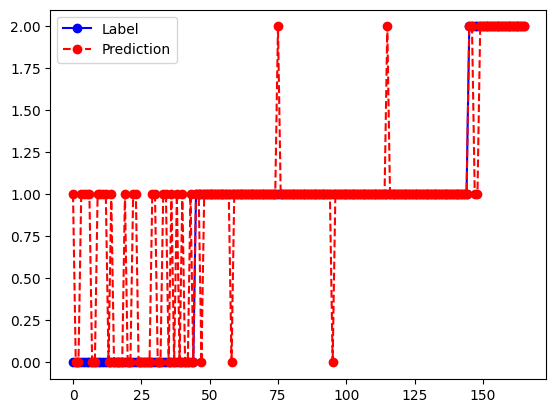

In [373]:
if classifier_model == 'ANN':
    # Predictions and labels.
    pred_C, label_C = model_C.test_model(Xphy_g, yphy_C)

    # Create categories.
    pred_C = np.argmax(pred_C, axis=1)
#     label_C = np.argmax(label_C, axis=1)
    
elif classifier_model == 'DTWKNN':
    # Predictions and labels.
    pred_C, label_C = model_C.test_model(Xphy_g, yphy_C)
    
elif classifier_model == 'QUANT':
    Xphy_g_tensor = torch.tensor(Xphy_g).float().unsqueeze(1)
    Xphy_g_transform = transform.transform(Xphy_g_tensor)
    pred_C = model_C.predict(Xphy_g_transform)
    label_C = yphy_C
    
elif classifier_model == 'CNN':
    # Prepare data.
    Xphy_g_expand = np.expand_dims(Xphy_g, axis=-1)
    
    # Predict on data.
    pred_C, test_loss, test_acc = model_C.predict(Xphy_g_expand, yphy_C)
    print(test_loss, test_acc)
    pred_C = np.argmax(pred_C, axis=1)
    label_C = yphy_C

print(label_C)
print(pred_C)

fig, ax = plt.subplots()
ax.plot(label_C, 'b-o', label='Label')
ax.plot(pred_C, 'r--o', label='Prediction')
ax.legend()

# Accuracy metrics.
tpr = true_positive_rate(label_C, pred_C)
print('True Positive Rate: {:.2f}'.format(tpr))

# Confusion matrix.
confusion_matrix = metrics.confusion_matrix(label_C, pred_C)
print(confusion_matrix)

In [627]:
# Plot severity and distance from sensor with the classification accuracy.
scenarios = np.unique(sim_db.scenario)
sensor_distances = []
fault_types = []
fault_severities = []
classifications = []
marker_style = []
upstream_distances = []
component_fault_type = {'diameter': 'Link', 'roughness': 'Link', 'silting': 'Storage'}
for i, scenario in enumerate(scenarios):
    print(i / len(scenarios))
    # Fault type.
    fault_type = sim_db.loc[sim_db['scenario'] == scenario, 'fault_type'].iloc[0] 
    fault_types.append(fault_type)
    
    # Fault component.
    fault_component = sim_db.loc[sim_db['scenario'] == scenario, 'fault_component'].iloc[0]
    
    # Distance upstream from nearest sensor to component.
    all_upstream_distances = []
    for sensor_link in sensor_links:
        upstream_distance = swmm.upstream_distance(sensor_link, 'Link', fault_component, component_fault_type[fault_type])
        all_upstream_distances.append(upstream_distance)
    # Smallest upstream distance between fault and sensor.
    upstream_distances.append(np.nanmin(all_upstream_distances))
    
    # Fault severity.
    fault_severity = sim_db.loc[sim_db['scenario'] == scenario, 'fault_value'].iloc[0]
    fault_severities.append(fault_severity)
    
    # Correct classification.
    classification = label_C[i] == pred_C[i]
    if classification == 1:
        classifications.append('blue')
        marker_style.append('o')
    else:
        classifications.append('red')
        marker_style.append('x')

0.0
0.006024096385542169
0.012048192771084338
0.018072289156626505
0.024096385542168676
0.030120481927710843
0.03614457831325301
0.04216867469879518
0.04819277108433735
0.05421686746987952
0.060240963855421686
0.06626506024096386
0.07228915662650602
0.0783132530120482
0.08433734939759036
0.09036144578313253
0.0963855421686747
0.10240963855421686
0.10843373493975904
0.1144578313253012
0.12048192771084337
0.12650602409638553
0.13253012048192772
0.13855421686746988
0.14457831325301204
0.15060240963855423
0.1566265060240964
0.16265060240963855
0.1686746987951807
0.1746987951807229
0.18072289156626506
0.18674698795180722
0.1927710843373494
0.19879518072289157
0.20481927710843373
0.21084337349397592
0.21686746987951808
0.22289156626506024
0.2289156626506024
0.23493975903614459
0.24096385542168675
0.2469879518072289
0.25301204819277107
0.25903614457831325
0.26506024096385544
0.2710843373493976
0.27710843373493976
0.28313253012048195
0.2891566265060241
0.29518072289156627
0.30120481927710846
0

[5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0, 250.0]


C:\Users\ay434\AppData\Local\Temp\ipykernel_25584\1494937139.py:22: UserWarning: You passed a edgecolor/edgecolors ('red') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax1.scatter(dist_sev_df.loc[i, 'distance'],
C:\Users\ay434\AppData\Local\Temp\ipykernel_25584\1494937139.py:27: UserWarning: You passed a edgecolor/edgecolors ('red') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax2.scatter(dist_sev_df.loc[i, 'distance'],
C:\Users\ay434\AppData\Local\Temp\ipykernel_25584\1494937139.py:33: UserWarning: You passed a edgecolor/edgecolors ('red') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax3.scatter(dist_sev_df.loc[i, 'distance'],


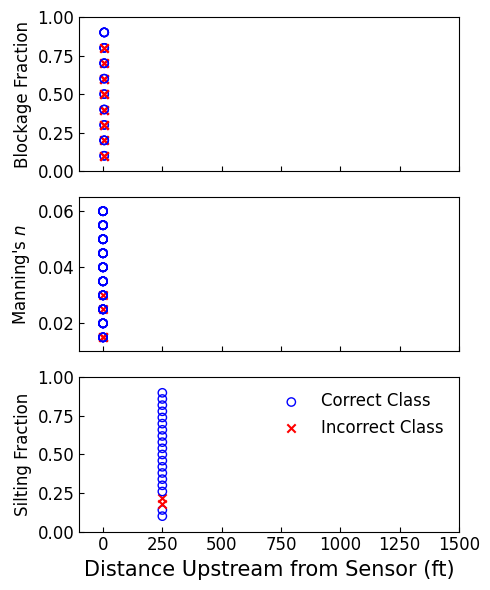

In [628]:
# Plot severity vs. distance w/ classification accuracy.
dist_sev_df = {'distance': upstream_distances, 'severity': fault_severities, 'classification': classifications,
              'fault_type': fault_types, 'marker_style': marker_style}
dist_sev_df = pd.DataFrame(dist_sev_df)

print(upstream_distances)


fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(5,6))
for i in range(len(upstream_distances)):
    classification = dist_sev_df.loc[i, 'classification']
    if classification == 'blue':
        marker = 'o'
        edgecolor = classification
        facecolor = 'none'
    else:
        marker = 'x'
        edgecolor = classification
        facecolor = classification
    
    if dist_sev_df.loc[i, 'fault_type'] == 'diameter':
        ax1.scatter(dist_sev_df.loc[i, 'distance'], 
                   dist_sev_df.loc[i, 'severity'], 
                   edgecolors = edgecolor,
                   marker=marker, facecolors=facecolor)
    elif dist_sev_df.loc[i, 'fault_type'] == 'roughness':
        ax2.scatter(dist_sev_df.loc[i, 'distance'], 
                   dist_sev_df.loc[i, 'severity'] * 0.01, 
                   edgecolors = edgecolor,
                   marker=marker, facecolors=facecolor)
        
    elif dist_sev_df.loc[i, 'fault_type'] == 'silting':
        ax3.scatter(dist_sev_df.loc[i, 'distance'], 
                   dist_sev_df.loc[i, 'severity'], 
                   edgecolors = edgecolor,
                   marker=marker, facecolors=facecolor)

# Legend.
ax3.scatter([], [], edgecolors='b', facecolors='none', marker='o', label='Correct Class')
ax3.scatter([], [], c='r', marker='x', label='Incorrect Class')

# Axis 1 settings.
ax1.set_ylim([0, 1])
ax1.set_xlim([-100, 1500])
ax1.xaxis.set_ticklabels([])
ax1.tick_params(axis='both', direction='in', labelsize=12)
ax1.set_ylabel('Blockage Fraction', fontsize=12)

# Axis 2 settings.
ax2.set_ylim([0.01, 0.065])
ax2.set_xlim([-100, 1500])
ax2.xaxis.set_ticklabels([])
ax2.tick_params(axis='both', direction='in', labelsize=12)
ax2.set_ylabel("Manning's $n$", fontsize=12)

# Axis 3 settings.
ax3.set_ylim([0, 1])
ax3.set_xlim([-100, 1500])
ax3.set_xlabel('Distance Upstream from Sensor (ft)', fontsize=15)
ax3.tick_params(axis='both', direction='in', labelsize=12)
ax3.set_ylabel("Silting Fraction", fontsize=12)
ax3.legend(frameon=False, fontsize=12)

fig.tight_layout()
# fig.savefig(fig_savefp / 'fault_class_severity_distance.png', dpi=300)

### 3. Fault localization

#### Prepare training and test data based on the type of fault.

In [ ]:
# Fault type.
fault_type = 'roughness'
fault_type_dict = {'diameter': 0, 'roughness': 1, 'silting': 2}

# Training data.
Xsim_g_L = Xsim_g[ysim_C == fault_type_dict[fault_type], :]
ysim_L_type = ysim_L[ysim_C == fault_type_dict[fault_type]]

# Testing data selection based on output of fault classifier model.
Xphy_g_L = Xphy_g[pred_C == fault_type_dict[fault_type], :]
yphy_L_type = yphy_L[pred_C == fault_type_dict[fault_type]]

print('Training data dimensions')
print(Xsim_g_L.shape)
print(ysim_L_type.shape)
print('\n', 'Testing data dimensions')
print(Xphy_g_L.shape)
print(yphy_L_type.shape)

In [868]:
# Model to use for localization.
localizer_model = 'ANN'

# Select model.
if localizer_model == 'ANN':
    # ANN Classifier
    # --------------------------------------------------------
    # Model, loss function, optimizer, and number of epochs.
    input_features = 1210
    output_features = 1
    lr = 0.001
    criterion = nn.MSELoss()  # Use CrossEntropyLoss for classification
    num_epochs = 1000  # Set the number of epochs

    # Instantiate model.
    model_L = ann_regressor.ANNRegressor(input_features, output_features, lr, num_epochs, criterion,
                     shuffle_train=True, shuffle_test=False)
    
    # Train model.
    upstream_dist_ar = np.array(upstream_distances)[:, np.newaxis]
    max_upstream_dist = np.max(upstream_dist_ar)
    upstream_dist_ar_norm = upstream_dist_ar / max_upstream_dist
    model_L.fit_model(Xsim_g, upstream_dist_ar_norm)

elif localizer_model == 'DTWKNN':
    # Dynamic time warping k-nearest neighbor
    # --------------------------------------------------------
    # Number of nearest neighbors. As a list.
    n_neighbors = 3
    
    # Instantiate model.
    model_L = dtw_knn_classifier.DTWKNNClassifier(n_neighbors)
    
    # Train model.
    model_L.fit_model(Xsim_g_L, ysim_L_type)
    
elif localizer_model == 'QUANT':
    # Quant time series classifier.
    # --------------------------------------------------------
    transform = quant.Quant()
    
    Xsim_g_tensor = torch.tensor(Xsim_g_L).float().unsqueeze(1)
    ysim_L_tensor = torch.tensor(ysim_L_type).float()

    X_training_transform = transform.fit_transform(Xsim_g_tensor, ysim_L_tensor)

    model_L = \
    ExtraTreesClassifier(
        n_estimators = 200,
        max_features = 0.1,
        criterion = "entropy",
        n_jobs = -1
    )
    
    # Train model.
    model_L.fit(X_training_transform, ysim_L_tensor)
    
print('Model trained.')

(166, 1)
Epoch: 0
Epoch: 1
Epoch: 2
Epoch: 3
Epoch: 4
Epoch: 5
Epoch: 6
Epoch: 7
Epoch: 8
Epoch: 9
Epoch: 10
Epoch: 11
Epoch: 12
Epoch: 13
Epoch: 14
Epoch: 15
Epoch: 16
Epoch: 17
Epoch: 18
Epoch: 19
Epoch: 20
Epoch: 21
Epoch: 22
Epoch: 23
Epoch: 24
Epoch: 25
Epoch: 26
Epoch: 27
Epoch: 28
Epoch: 29
Epoch: 30
Epoch: 31
Epoch: 32
Epoch: 33
Epoch: 34
Epoch: 35
Epoch: 36
Epoch: 37
Epoch: 38
Epoch: 39
Epoch: 40
Epoch: 41
Epoch: 42
Epoch: 43
Epoch: 44
Epoch: 45
Epoch: 46
Epoch: 47
Epoch: 48
Epoch: 49
Epoch: 50
Epoch: 51
Epoch: 52
Epoch: 53
Epoch: 54
Epoch: 55
Epoch: 56
Epoch: 57
Epoch: 58
Epoch: 59
Epoch: 60
Epoch: 61
Epoch: 62
Epoch: 63
Epoch: 64
Epoch: 65
Epoch: 66
Epoch: 67


KeyboardInterrupt: 

ACC 5.6647773
95% 48.202369689941406


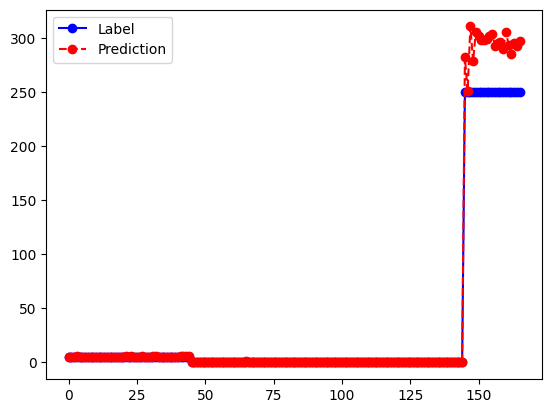

In [630]:
if localizer_model == 'ANN':
    # Predictions and labels.
    pred_L, label_L = model_L.test_model(Xphy_g, upstream_dist_ar_norm)

    # Create categories.
#     label_L = np.argmax(label_L, axis=1)
    
elif localizer_model == 'DTWKNN':
    # Predictions and labels.
    pred_L, label_L = model_L.test_model(Xphy_g_L, yphy_L_type)
    
elif localizer_model == 'QUANT':
    Xphy_g_tensor = torch.tensor(Xphy_g_L).float().unsqueeze(1)
    Xphy_g_transform = transform.transform(Xphy_g_tensor)
    pred_L = model_L.predict(Xphy_g_transform)
    label_L = yphy_L_type

fig, ax = plt.subplots()
ax.plot(label_L * max_upstream_dist, 'b-o', label='Label')
ax.plot(pred_L * max_upstream_dist, 'r--o', label='Prediction')
ax.legend()

# Mean distance accuracy.
print('ACC', np.mean(np.abs(pred_L * max_upstream_dist - label_L * max_upstream_dist)))
print('95%', np.percentile(np.abs(pred_L * max_upstream_dist - label_L * max_upstream_dist), 95))

# # Accuracy metrics.
# tpr = true_positive_rate(label_L, pred_L)
# print('True Positive Rate: {:.2f}'.format(tpr))

# # Confusion matrix.
# confusion_matrix = metrics.confusion_matrix(label_L, pred_L)
# print(confusion_matrix)

#### Roughness fault localization

### 4. Fault severity

#### Train model

In [908]:
# Normalize labels between 0 and 1.
ysim_S_norm = ysim_S.copy()
for i in np.unique(ysim_C):
    ysim_S_norm[ysim_C==i] = data_utils.scale_to_unity(ysim_S_norm[ysim_C==i])
ysim_S_norm = ysim_S_norm[:, np.newaxis]

yphy_S_norm = yphy_S.copy()
for i in np.unique(yphy_C):
    yphy_S_norm[yphy_C==i] = data_utils.scale_to_unity(yphy_S_norm[yphy_C==i])
yphy_S_norm = yphy_S_norm[:, np.newaxis]

In [909]:
# Model, loss function, and optimizer
input_features = 1210
output_features = 1
lr = 0.001
criterion = nn.MSELoss()
num_epochs = 1000  # Set the number of epochs

# Instantiate model.
model_S = ann_regressor.ANNRegressor(input_features, output_features, lr, num_epochs, criterion,
                 shuffle_train=True, shuffle_test=False)

# Train model.
model_S.fit_model(Xsim_g, ysim_S_norm)
# model_S.fit_model(np.column_stack([Xsim_g, ysim_C]), ysim_S_norm)

Epoch: 0
Epoch: 1
Epoch: 2
Epoch: 3
Epoch: 4
Epoch: 5
Epoch: 6
Epoch: 7
Epoch: 8
Epoch: 9
Epoch: 10
Epoch: 11
Epoch: 12
Epoch: 13
Epoch: 14
Epoch: 15
Epoch: 16
Epoch: 17
Epoch: 18
Epoch: 19
Epoch: 20
Epoch: 21
Epoch: 22
Epoch: 23
Epoch: 24
Epoch: 25
Epoch: 26
Epoch: 27
Epoch: 28
Epoch: 29
Epoch: 30
Epoch: 31
Epoch: 32
Epoch: 33
Epoch: 34
Epoch: 35
Epoch: 36
Epoch: 37
Epoch: 38
Epoch: 39
Epoch: 40
Epoch: 41
Epoch: 42
Epoch: 43
Epoch: 44
Epoch: 45
Epoch: 46
Epoch: 47
Epoch: 48
Epoch: 49
Epoch: 50
Epoch: 51
Epoch: 52
Epoch: 53
Epoch: 54
Epoch: 55
Epoch: 56
Epoch: 57
Epoch: 58
Epoch: 59
Epoch: 60
Epoch: 61
Epoch: 62
Epoch: 63
Epoch: 64
Epoch: 65
Epoch: 66
Epoch: 67
Epoch: 68
Epoch: 69
Epoch: 70
Epoch: 71
Epoch: 72
Epoch: 73
Epoch: 74
Epoch: 75
Epoch: 76
Epoch: 77
Epoch: 78
Epoch: 79
Epoch: 80
Epoch: 81
Epoch: 82
Epoch: 83
Epoch: 84
Epoch: 85
Epoch: 86
Epoch: 87
Epoch: 88
Epoch: 89
Epoch: 90
Epoch: 91
Epoch: 92
Epoch: 93
Epoch: 94
Epoch: 95
Epoch: 96
Epoch: 97
Epoch: 98
Epoch: 99
Epoch: 100

Epoch: 757
Epoch: 758
Epoch: 759
Epoch: 760
Epoch: 761
Epoch: 762
Epoch: 763
Epoch: 764
Epoch: 765
Epoch: 766
Epoch: 767
Epoch: 768
Epoch: 769
Epoch: 770
Epoch: 771
Epoch: 772
Epoch: 773
Epoch: 774
Epoch: 775
Epoch: 776
Epoch: 777
Epoch: 778
Epoch: 779
Epoch: 780
Epoch: 781
Epoch: 782
Epoch: 783
Epoch: 784
Epoch: 785
Epoch: 786
Epoch: 787
Epoch: 788
Epoch: 789
Epoch: 790
Epoch: 791
Epoch: 792
Epoch: 793
Epoch: 794
Epoch: 795
Epoch: 796
Epoch: 797
Epoch: 798
Epoch: 799
Epoch: 800
Epoch: 801
Epoch: 802
Epoch: 803
Epoch: 804
Epoch: 805
Epoch: 806
Epoch: 807
Epoch: 808
Epoch: 809
Epoch: 810
Epoch: 811
Epoch: 812
Epoch: 813
Epoch: 814
Epoch: 815
Epoch: 816
Epoch: 817
Epoch: 818
Epoch: 819
Epoch: 820
Epoch: 821
Epoch: 822
Epoch: 823
Epoch: 824
Epoch: 825
Epoch: 826
Epoch: 827
Epoch: 828
Epoch: 829
Epoch: 830
Epoch: 831
Epoch: 832
Epoch: 833
Epoch: 834
Epoch: 835
Epoch: 836
Epoch: 837
Epoch: 838
Epoch: 839
Epoch: 840
Epoch: 841
Epoch: 842
Epoch: 843
Epoch: 844
Epoch: 845
Epoch: 846
Epoch: 847

ANNRegressor(
  (criterion): MSELoss()
  (fc1): Linear(in_features=1210, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=256, bias=True)
  (fc3): Linear(in_features=256, out_features=128, bias=True)
  (fc4): Linear(in_features=128, out_features=64, bias=True)
  (fc5): Linear(in_features=64, out_features=1, bias=True)
  (relu): ReLU()
  (sigmoid): Sigmoid()
  (softmax): Softmax(dim=1)
)

Mean Relative Difference 17.0%
Mean Relative Difference 9.4%
Mean Relative Difference 13.5%


(0.0, 1.0)

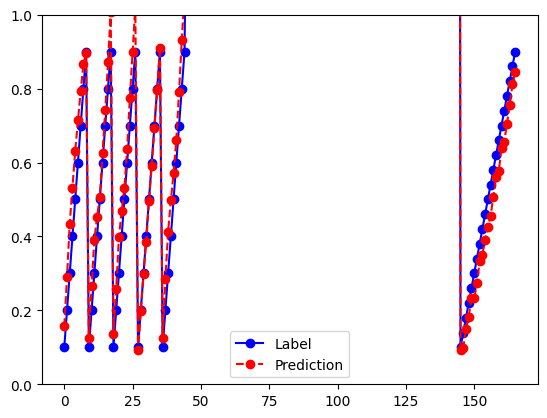

In [911]:
# Predictions and labels.
pred_S, label_S = model_S.test_model(Xphy_g, yphy_S_norm)
# pred_S, label_S = model_S.test_model(np.column_stack([Xphy_g, pred_C]), yphy_S_norm)

# Denorm predictions and labels.
for i in np.unique(ysim_C):
    xmin, xmax = np.min(ysim_S[ysim_C == i]), np.max(ysim_S[ysim_C == i])
    label_S[ysim_C == i] = data_utils.unscale_from_unity(label_S[ysim_C == i], xmin, xmax)
    pred_S[ysim_C == i] = data_utils.unscale_from_unity(pred_S[ysim_C == i], xmin, xmax)
    
    # Relative difference.
    rel_diff = np.abs(pred_S[ysim_C == i] - label_S[ysim_C == i]) / label_S[ysim_C == i] * 100
    print('Mean Relative Difference {:.1f}%'.format(np.mean(rel_diff)))

fig, ax = plt.subplots()
ax.plot(label_S, 'b-o', label='Label')
ax.plot(pred_S, 'r--o', label='Prediction')
ax.legend()
# ax.set_ylim([0, 1])

#### Test model

In [88]:
def ME(label, prediction):
    me = np.sum(prediction - label) / len(label)
    
    return me

['silting' 'silting' 'silting' 'silting' 'silting' 'silting' 'silting'
 'silting' 'silting' 'silting' 'silting' 'silting' 'silting' 'silting'
 'silting' 'silting' 'silting' 'silting' 'silting' 'silting' 'silting'
 'roughness' 'roughness' 'roughness' 'roughness' 'roughness' 'roughness'
 'roughness' 'roughness' 'roughness' 'roughness' 'roughness' 'roughness'
 'roughness' 'roughness' 'roughness' 'roughness' 'roughness' 'roughness'
 'roughness' 'roughness' 'roughness' 'roughness' 'roughness' 'roughness'
 'roughness' 'roughness' 'roughness' 'roughness' 'roughness' 'roughness'
 'roughness' 'roughness' 'roughness' 'roughness' 'roughness' 'roughness'
 'roughness' 'roughness' 'roughness' 'roughness' 'roughness' 'roughness'
 'roughness' 'roughness' 'roughness' 'roughness' 'roughness' 'roughness'
 'roughness' 'roughness' 'roughness' 'roughness' 'roughness' 'roughness'
 'roughness' 'roughness' 'roughness' 'roughness' 'roughness' 'roughness'
 'roughness' 'roughness' 'roughness' 'roughness' 'roughne

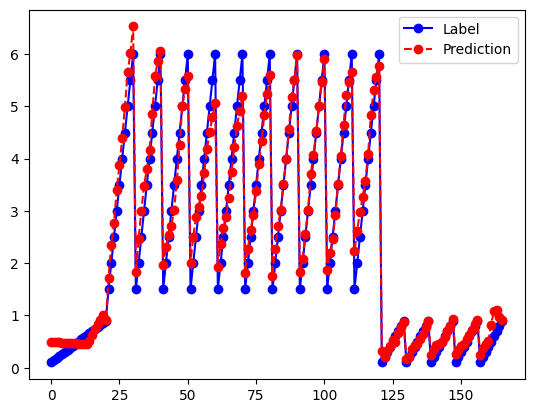

In [89]:
# Set the model to evaluation mode
model_S.eval()

# Predictions and labels.
pred_S, label_S = test_model(model_S, test_loader_S, model_type='regress')

fig, ax = plt.subplots()
ax.plot(label_S, 'b-o', label='Label')
ax.plot(pred_S, 'r--o', label='Prediction')
ax.legend()

print(yphy[:,2])

for fault_type in ['diameter', 'roughness', 'silting']:    
    me = ME(label_S[yphy[:,2] == fault_type], pred_S[yphy[:,2] == fault_type])
    print(fault_type, 'mean error:', me)


### Saliency maps

In [28]:
print(Xphy_g.shape)

(166, 242)


In [95]:
saliency = np.zeros((Xphy_g.shape[0], Xphy_g.shape[1]))
for i in range(Xphy_g.shape[0]):
    # Example input data (make sure it's in the right shape for your model)
    input_data = torch.tensor(Xphy_g, dtype=torch.float32, requires_grad=True)  # Adjust dimensions as needed

    # Ensure the model is in evaluation mode
    model_C.eval()

    # Forward pass
    output = model_C(input_data)

    # Assuming you're interested in the gradients with respect to the first output neuron
    output = output[i, 2]  # Adjust this index based on your output shape

    # Backward pass to compute gradients
    output.backward()

    # The gradient stored in input_data.grad is the saliency map
    saliency_map = input_data.grad.data.abs().numpy()
    saliency[i,:] = saliency_map[i,:]

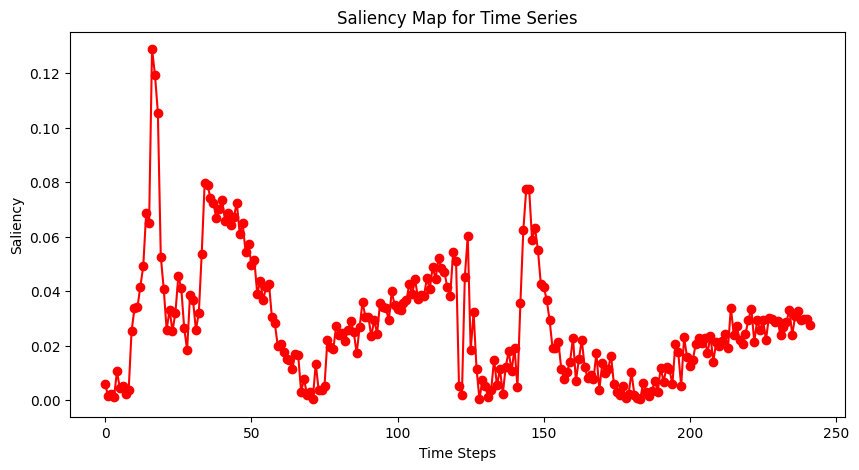

In [96]:
# Visualize the saliency map
plt.figure(figsize=(10, 5))
plt.plot(np.mean(saliency_map, axis=0), marker='o', linestyle='-', color='r')
plt.title('Saliency Map for Time Series')
plt.xlabel('Time Steps')
plt.ylabel('Saliency')
plt.show()

In [153]:
print(sim_db.scenario)

0          0
1          0
2          0
3          0
4          0
        ... 
59755    165
59756    165
59757    165
59758    165
59759    165
Name: scenario, Length: 59760, dtype: int64


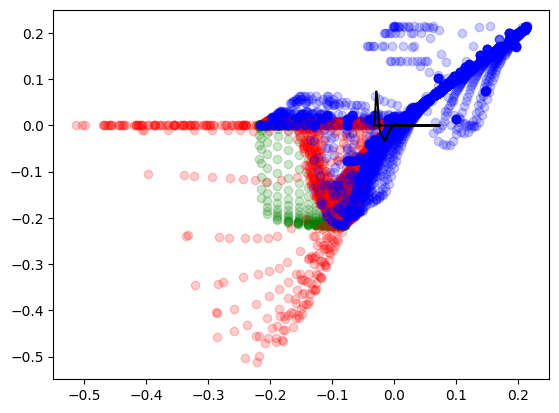

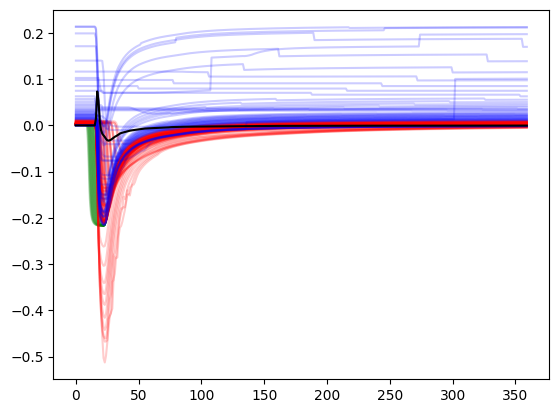

In [83]:
colors = {'diameter': 'blue', 'roughness': 'red', 'silting': 'green'}

fig, ax = plt.subplots()
lag = 12
for i in range(Xsim.shape[2]):
    ax.scatter(Xsim[lag:,0,i], Xsim[:-1-lag+1,0,i], c=colors[ysim[i,2]], alpha=0.2)
ax.plot(healthy_residual_df.iloc[lag:,0], healthy_residual_df.iloc[:-1-lag+1,0], c='k')

# Unique components.
fig, ax = plt.subplots()
for i in range(Xsim.shape[2]):
    ax.plot(Xsim[:,0,i], c=colors[ysim[i,2]], alpha=0.2)
ax.plot(healthy_residual_df.iloc[:,0], c='k')

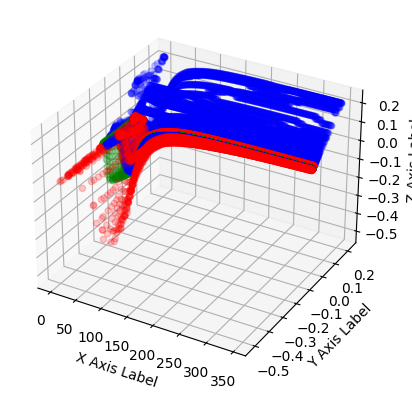

In [87]:
from mpl_toolkits.mplot3d import Axes3D

# Example color mapping
colors = {'diameter': 'blue', 'roughness': 'red', 'silting': 'green'}

# Creating a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

lag = 12

for i in range(Xsim.shape[2]):
    ax.scatter(np.arange(Xsim[lag:,0,i].shape[0]), Xsim[lag:,0,i], Xsim[:-1-lag+1,0,i], c=colors[ysim[i,2]], alpha=0.2)

# Plotting the healthy residual in 3D
ax.plot(np.arange(Xsim[lag:,0,i].shape[0]), healthy_residual_df.iloc[lag:,0], healthy_residual_df.iloc[:-1-lag+1,0], c='k')

ax.set_xlabel('X Axis Label')
ax.set_ylabel('Y Axis Label')
ax.set_zlabel('Z Axis Label')

plt.show()

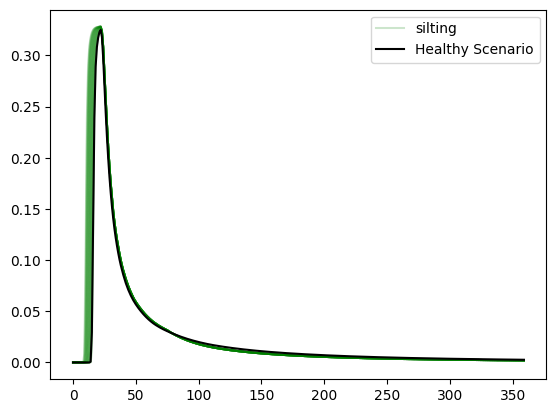

In [22]:
# Track which labels have already been added to the legend
labels_added = {}

fig, ax = plt.subplots()
for i in np.unique(sim_db.scenario):
    depths = sim_db.loc[sim_db['scenario'] == i, 'Depth_link_20'].to_numpy()
    fault_type = sim_db.loc[sim_db['scenario'] == i, 'fault_type'].iloc[0]
    
    if fault_type != 'silting':
        continue
    
    # Only add the label to the legend if it hasn't been added yet
    if fault_type not in labels_added:
        ax.plot(np.arange(len(depths)), depths, c=colors[fault_type], alpha=0.2, label=fault_type)
        labels_added[fault_type] = True
    else:
        ax.plot(np.arange(len(depths)), depths, c=colors[fault_type], alpha=0.2)

# Plot the sim_healthy_db with its own label
ax.plot(sim_healthy_db.iloc[:,0], c='k', label='Healthy Scenario')

# Add the legend
ax.legend()



## Most "diameter" state space.

In [102]:


niter = 3000 # Number of SGD iterations to run.
dmax = torch.max(Xsim_g[:,:360])
dmin = torch.min(Xsim_g[:,:360])
vmax = torch.max(Xsim_g[:,360:])
vmin = torch.min(Xsim_g[:,360:])
X_diam = np.zeros((1, 720))
X_diam = torch.tensor(X_diam, dtype=torch.float32, requires_grad=True)
X_diam = torch.nn.Parameter(X_diam)
y_diam = np.array([0])

optimizer = optim.SGD([X_diam], lr=0.001)

for i in range(niter):
    # Zero the parameter gradients
    optimizer.zero_grad()

    # Forward pass: compute the model output
    outputs = model_C(X_diam)

    # Define the objective function: maximize outputs[0] and minimize outputs[1] and outputs[2]
    objective =  outputs[0][0] - outputs[0][1] + outputs[0][2] - torch.var(X_diam)

    # Backward pass: compute gradient of the loss with respect to X_diam
    objective.backward()

    # Update X_diam using the optimizer
    optimizer.step()

    # Apply constraints
    with torch.no_grad():
        X_diam.data[:, :360] = torch.clamp(X_diam.data[:, :360], dmin, dmax)
        X_diam.data[:, 360:] = torch.clamp(X_diam.data[:, 360:], dmin, dmax)

    # Print progress (optional)
    if i % 200 == 0:
        print(f"Iteration {i}, Objective: {objective.item()}")

Iteration 0, Objective: -2.4298532009124756
Iteration 200, Objective: -4022.4365234375
Iteration 400, Objective: -4028.231689453125
Iteration 600, Objective: -4029.136474609375
Iteration 800, Objective: -4029.362548828125
Iteration 1000, Objective: -4029.484619140625
Iteration 1200, Objective: -4029.567626953125
Iteration 1400, Objective: -4029.630126953125
Iteration 1600, Objective: -4029.66943359375
Iteration 1800, Objective: -4029.68798828125
Iteration 2000, Objective: -4029.70703125
Iteration 2200, Objective: -4029.724853515625
Iteration 2400, Objective: -4029.74169921875
Iteration 2600, Objective: -4029.7578125
Iteration 2800, Objective: -4029.774169921875


tensor([[  824.6731,   493.5804, -4360.7754]], grad_fn=<AddmmBackward0>)


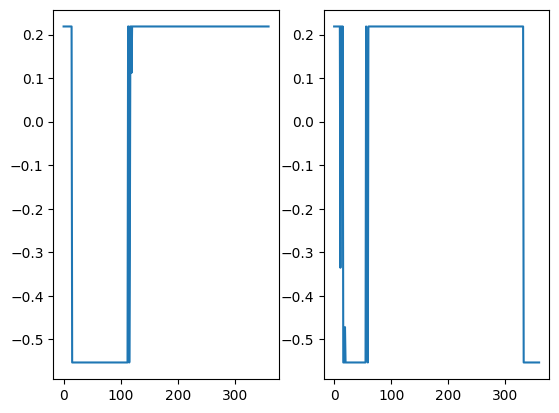

In [103]:
X_diam_plot = np.squeeze(X_diam.detach().numpy())


fig, (ax1, ax2) = plt.subplots(1,2)
ax1.plot(X_diam_plot[:360])
ax2.plot(X_diam_plot[360:])

print(model_C(X_diam))